In [1]:
import os
import math

import sklearn.metrics as metrics
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import sklearn

from numpy import load
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn.model_selection import ParameterGrid
from sklearn.metrics import f1_score
from sklearn import tree
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsClassifier

from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

from xgboost import XGBClassifier

from sklearn.impute import KNNImputer

from sklearn.svm import SVC

%matplotlib inline
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

rd_seed = 333

## Načtení dat

In [2]:
path_file = os.sep.join(['created_data', 'matrix_bak.csv'])
matrix_bak = pd.read_csv(path_file, sep=",")

## Info o datasetu

In [3]:
matrix_bak.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8043 entries, 0 to 8042
Data columns (total 33 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   studium_id              8043 non-null   int64  
 1   pohlavi_kod             8043 non-null   int64  
 2   je_cech                 8043 non-null   int64  
 3   datum_zahajeni          8043 non-null   int64  
 4   rok_maturity            8043 non-null   int64  
 5   maturita_nastup_rozdil  8043 non-null   int64  
 6   gymnazium               8043 non-null   int64  
 7   praha                   8043 non-null   int64  
 8   scio                    8043 non-null   int64  
 9   olym                    8043 non-null   int64  
 10  zkouska                 8043 non-null   int64  
 11  prominuti               8043 non-null   int64  
 12  dostudoval_uspesne      8043 non-null   int64  
 13  BI-PA1                  7777 non-null   float64
 14  BI-PAI                  7771 non-null   

In [4]:
matrix_bak.mean()

studium_id                1.040487e+07
pohlavi_kod               1.123959e-01
je_cech                   8.051722e-01
datum_zahajeni            2.014520e+03
rok_maturity              2.013731e+03
maturita_nastup_rozdil    7.888847e-01
gymnazium                 5.391023e-01
praha                     6.032575e-01
scio                      5.856024e-02
olym                      5.197066e-02
zkouska                   1.765510e-02
prominuti                 1.380082e-02
dostudoval_uspesne        2.627129e-01
BI-PA1                    3.010801e+00
BI-PAI                    2.751448e+00
BI-CAO                    2.011711e+00
BI-PS1                    3.089703e+00
BI-MLO                    2.842469e+00
BI-ZMA                    3.116803e+00
BI-PA2                    2.932023e+00
BI-DBS                    2.431794e+00
BI-SAP                    2.342852e+00
BI-LIN                    3.175494e+00
BI-AG1                    2.829365e+00
BI-AAG                    2.657908e+00
BI-ZDM                   

## Příprava datasetu

### Nastavení indexu

In [5]:
matrix_bak = matrix_bak.set_index(['studium_id'])

### Přidání příznaků

In [6]:
matrix_bak['prumer'] = matrix_bak.loc[:, 'BI-PA1':'BI-EMP'].mean(axis=1)

In [7]:
matrix_bak.mean()

pohlavi_kod                  0.112396
je_cech                      0.805172
datum_zahajeni            2014.519955
rok_maturity              2013.731070
maturita_nastup_rozdil       0.788885
gymnazium                    0.539102
praha                        0.603257
scio                         0.058560
olym                         0.051971
zkouska                      0.017655
prominuti                    0.013801
dostudoval_uspesne           0.262713
BI-PA1                       3.010801
BI-PAI                       2.751448
BI-CAO                       2.011711
BI-PS1                       3.089703
BI-MLO                       2.842469
BI-ZMA                       3.116803
BI-PA2                       2.932023
BI-DBS                       2.431794
BI-SAP                       2.342852
BI-LIN                       3.175494
BI-AG1                       2.829365
BI-AAG                       2.657908
BI-ZDM                       2.780128
BI-OSY                       2.669397
BI-PSI      

### Doplnění NaN hodnot

##### Doplnění pomocí KNNImputer

In [8]:
imputer = KNNImputer(n_neighbors=5, weights='distance')
matrix_bak = pd.DataFrame(imputer.fit_transform(matrix_bak), index=matrix_bak.index, columns=matrix_bak.columns)

In [9]:
matrix_bak.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8043 entries, 1578106 to 1577906
Data columns (total 33 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   pohlavi_kod             8043 non-null   float64
 1   je_cech                 8043 non-null   float64
 2   datum_zahajeni          8043 non-null   float64
 3   rok_maturity            8043 non-null   float64
 4   maturita_nastup_rozdil  8043 non-null   float64
 5   gymnazium               8043 non-null   float64
 6   praha                   8043 non-null   float64
 7   scio                    8043 non-null   float64
 8   olym                    8043 non-null   float64
 9   zkouska                 8043 non-null   float64
 10  prominuti               8043 non-null   float64
 11  dostudoval_uspesne      8043 non-null   float64
 12  BI-PA1                  8043 non-null   float64
 13  BI-PAI                  8043 non-null   float64
 14  BI-CAO                  8043 no

#### Zaokrouhlení doplněných hodnot

In [10]:
grades = [1, 1.5, 2, 2.5, 3, 4]

In [11]:
def custom_round(value):
    return min(grades, key=lambda x:abs(x-value))

In [12]:
matrix_bak.loc[:, 'BI-PA1':'BI-EMP'] = matrix_bak.loc[:, 'BI-PA1':'BI-EMP'].applymap(custom_round)

In [13]:
matrix_bak

,pohlavi_kod,je_cech,datum_zahajeni,rok_maturity,maturita_nastup_rozdil,gymnazium,praha,scio,olym,zkouska,prominuti,dostudoval_uspesne,BI-PA1,BI-PAI,BI-CAO,BI-PS1,BI-MLO,BI-ZMA,BI-PA2,BI-DBS,BI-SAP,BI-LIN,BI-AG1,BI-AAG,BI-ZDM,BI-OSY,BI-PSI,BI-BEZ,BI-PST,BI-DPR,BI-SI1.2,BI-EMP,prumer
studium_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1578106,0.0,0.0,2009.0,2007.0,2.0,0.0,2.0,0.0,0.0,0.0,0.0,1.0,2.0,1.5,1.5,2.0,2.0,2.0,3.0,2.0,1.5,1.0,3.0,2.0,3.0,1.5,2.0,3.0,1.5,1.5,2.5,3.0,2.026316
1584806,0.0,0.0,2009.0,2006.0,3.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,2.0,2.5,3.0,3.0,3.0,2.5,3.0,2.5,2.5,2.5,2.0,2.0,2.5,4.000000
19374606,0.0,1.0,2021.0,2009.0,12.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,4.0,2.5,4.0,4.0,3.0,3.0,3.0,3.0,4.0,4.0,3.0,3.0,3.0,2.5,2.0,2.5,2.0,2.0,2.0,2.5,4.000000
4783406,0.0,1.0,2011.0,2009.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,3.0,1.5,4.0,2.5,2.5,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.5,2.5,3.0,3.277778
8396706,1.0,1.0,2013.0,2009.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,3.0,3.0,2.5,3.0,4.0,2.5,4.000000
4047706,0.0,1.0,2010.0,2009.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,3.0,1.5,3.0,1.5,1.5,3.0,2.0,1.5,2.5,2.5,2.5,2.0,2.5,2.5,2.5,2.0,1.5,1.5,2.5,2.210526
4288906,0.0,1.0,2010.0,2010.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,4.0,4.0,1.5,2.5,1.5,1.0,4.0,4.0,4.0,4.0,3.0,4.0,3.0,4.0,3.0,4.0,4.0,2.0,3.0,3.0,2.944444
5497506,1.0,1.0,2011.0,2009.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,2.5,3.0,3.0,4.0,3.0,4.0,4.0,4.0,1.5,2.0,4.0,4.0,4.0,2.0,4.0,3.0,3.0,2.5,3.0,3.0,3.153846
9226106,0.0,1.0,2014.0,2009.0,5.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.5,1.5,1.0,2.5,2.0,1.5,4.0,2.5,4.0,2.0,4.0,3.0,3.0,2.5,2.5,4.0,4.0,1.0,2.0,4.0,2.552632


### Pomocné promenné

In [14]:
# predmety podle doporuceneho semestru
courses_1 = ['BI-PA1', 'BI-PAI', 'BI-CAO', 'BI-PS1', 'BI-MLO', 'BI-ZMA']
courses_2 = ['BI-PA2', 'BI-DBS', 'BI-SAP', 'BI-LIN']
courses_3 = ['BI-AAG', 'BI-ZDM', 'BI-AG1']
courses_4 = ['BI-OSY', 'BI-PSI', 'BI-BEZ']
courses_5 = ['BI-PST']
courses_6 = ['BI-DPR']
courses_7 = ['BI-SI1.2', 'BI-EMP']

courses = courses_1 + courses_2 + courses_3 + courses_4 + courses_5 + courses_6 + courses_7

In [15]:
means = {'BI-PA1':3, 'BI-PAI':3, 'BI-CAO':2, 'BI-PS1':3, 'BI-MLO':3, 'BI-ZMA':3,
        'BI-PA2':3, 'BI-DBS':2.5, 'BI-SAP':2.5, 'BI-LIN':3,
        'BI-AAG':3, 'BI-ZDM':3, 'BI-AG1':3,
        'BI-OSY':2.5, 'BI-PSI':2.5, 'BI-BEZ':2.5,
        'BI-PST':2,
        'BI-DPR':1.5,
        'BI-SI1.2':2, 'BI-EMP':2
        }

prumer_mean = 3

### Nastavení target proměnné na nominální

In [16]:
dostudoval_uspesne_category = pd.api.types.CategoricalDtype(categories=[0, 1], ordered=False)
matrix_bak['dostudoval_uspesne'] = matrix_bak['dostudoval_uspesne'].astype(dostudoval_uspesne_category)

In [17]:
matrix_bak.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8043 entries, 1578106 to 1577906
Data columns (total 33 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   pohlavi_kod             8043 non-null   float64 
 1   je_cech                 8043 non-null   float64 
 2   datum_zahajeni          8043 non-null   float64 
 3   rok_maturity            8043 non-null   float64 
 4   maturita_nastup_rozdil  8043 non-null   float64 
 5   gymnazium               8043 non-null   float64 
 6   praha                   8043 non-null   float64 
 7   scio                    8043 non-null   float64 
 8   olym                    8043 non-null   float64 
 9   zkouska                 8043 non-null   float64 
 10  prominuti               8043 non-null   float64 
 11  dostudoval_uspesne      8043 non-null   category
 12  BI-PA1                  8043 non-null   float64 
 13  BI-PAI                  8043 non-null   float64 
 14  BI-CAO         

### Nastavení atributů na kategorické - ordinální

In [18]:
# ordinální
grades_category = pd.api.types.CategoricalDtype(categories=[1, 1.5, 2, 2.5, 3, 4, 0], ordered=True)
# BI-PA1
matrix_bak['BI-PA1'] = matrix_bak['BI-PA1'].astype(grades_category)
# BI-PAI
matrix_bak['BI-PAI'] = matrix_bak['BI-PAI'].astype(grades_category)
# BI-CAO
matrix_bak['BI-CAO'] = matrix_bak['BI-CAO'].astype(grades_category)
# BI-PS1
matrix_bak['BI-PS1'] = matrix_bak['BI-PS1'].astype(grades_category)
# BI-MLO
matrix_bak['BI-MLO'] = matrix_bak['BI-MLO'].astype(grades_category)
# BI-ZMA
matrix_bak['BI-ZMA'] = matrix_bak['BI-ZMA'].astype(grades_category)
# BI-PA2
matrix_bak['BI-PA2'] = matrix_bak['BI-PA2'].astype(grades_category)
# BI-DBS
matrix_bak['BI-DBS'] = matrix_bak['BI-DBS'].astype(grades_category)
# BI-SAP
matrix_bak['BI-SAP'] = matrix_bak['BI-SAP'].astype(grades_category)
# BI-LIN
matrix_bak['BI-LIN'] = matrix_bak['BI-LIN'].astype(grades_category)
# BI-AG1
matrix_bak['BI-AG1'] = matrix_bak['BI-AG1'].astype(grades_category)
# BI-AAG
matrix_bak['BI-AAG'] = matrix_bak['BI-AAG'].astype(grades_category)
# BI-ZDM
matrix_bak['BI-ZDM'] = matrix_bak['BI-ZDM'].astype(grades_category)
# BI-OSY
matrix_bak['BI-OSY'] = matrix_bak['BI-OSY'].astype(grades_category)
# BI-PSI
matrix_bak['BI-PSI'] = matrix_bak['BI-PSI'].astype(grades_category)
# BI-BEZ
matrix_bak['BI-BEZ'] = matrix_bak['BI-BEZ'].astype(grades_category)
# BI-PST
matrix_bak['BI-PST'] = matrix_bak['BI-PST'].astype(grades_category)
# BI-SI1.2
matrix_bak['BI-SI1.2'] = matrix_bak['BI-SI1.2'].astype(grades_category)
# BI-MLO
matrix_bak['BI-EMP'] = matrix_bak['BI-EMP'].astype(grades_category)
# BI-DPR
matrix_bak['BI-DPR'] = matrix_bak['BI-DPR'].astype(grades_category)

In [19]:
matrix_bak.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8043 entries, 1578106 to 1577906
Data columns (total 33 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   pohlavi_kod             8043 non-null   float64 
 1   je_cech                 8043 non-null   float64 
 2   datum_zahajeni          8043 non-null   float64 
 3   rok_maturity            8043 non-null   float64 
 4   maturita_nastup_rozdil  8043 non-null   float64 
 5   gymnazium               8043 non-null   float64 
 6   praha                   8043 non-null   float64 
 7   scio                    8043 non-null   float64 
 8   olym                    8043 non-null   float64 
 9   zkouska                 8043 non-null   float64 
 10  prominuti               8043 non-null   float64 
 11  dostudoval_uspesne      8043 non-null   category
 12  BI-PA1                  8043 non-null   category
 13  BI-PAI                  8043 non-null   category
 14  BI-CAO         

## Modelování

### Bakalář všechny pp

#### Rozdělení datasetu

In [20]:
Xdata = matrix_bak.drop(columns='dostudoval_uspesne')
ydata = matrix_bak.dostudoval_uspesne

In [21]:
Xtrain, Xtest, ytrain, ytest = train_test_split(Xdata, ydata, test_size=0.2, random_state=rd_seed, stratify=ydata, shuffle=True) 
print("původní data")
display(Xdata.shape)
display(ydata.shape)
print("trénovací data")
display(Xtrain.shape)
display(ytrain.shape)
print("testovací data")
display(Xtest.shape)
display(ytest.shape)

původní data


(8043, 32)

(8043,)

trénovací data


(6434, 32)

(6434,)

testovací data


(1609, 32)

(1609,)

#### Funkce pro vybrání vhodných hyperparametrů pomocí křížové validace

In [22]:
def get_best_parameters(param_grid, classifier, xgb=None):
    score = 'f1'
    if xgb:
        model = GridSearchCV(classifier(eval_metric='mlogloss', use_label_encoder=False, tree_method="gpu_hist", enable_categorical=True), param_grid, cv=5, scoring=score)
    else:
        model = GridSearchCV(classifier(), param_grid, cv=5, scoring=score)
    model.fit(Xtrain, ytrain)

    print('Best hyper-parameters are: ')
    print(model.best_params_)
    print()

    means = model.cv_results_["mean_test_score"]
    stds = model.cv_results_["std_test_score"]
    for mean, std, params in zip(means, stds, model.cv_results_["params"]):
        print("%0.6f (+/-%0.06f) for %r" % (mean, std * 2, params))
    print()
    return model

#### Rozhodovací strom

In [23]:
param_grid = [
    {'criterion':['gini','entropy'],
    'max_depth': range(2,7),
    'min_samples_leaf':[10]}
]

In [24]:
dt_f1 = get_best_parameters(param_grid, DecisionTreeClassifier)

Best hyper-parameters are: 
{'criterion': 'gini', 'max_depth': 6, 'min_samples_leaf': 10}

0.909495 (+/-0.011886) for {'criterion': 'gini', 'max_depth': 2, 'min_samples_leaf': 10}
0.912487 (+/-0.009375) for {'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 10}
0.930895 (+/-0.010656) for {'criterion': 'gini', 'max_depth': 4, 'min_samples_leaf': 10}
0.941027 (+/-0.012145) for {'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 10}
0.950073 (+/-0.012395) for {'criterion': 'gini', 'max_depth': 6, 'min_samples_leaf': 10}
0.910641 (+/-0.009312) for {'criterion': 'entropy', 'max_depth': 2, 'min_samples_leaf': 10}
0.924652 (+/-0.005384) for {'criterion': 'entropy', 'max_depth': 3, 'min_samples_leaf': 10}
0.928814 (+/-0.005118) for {'criterion': 'entropy', 'max_depth': 4, 'min_samples_leaf': 10}
0.940090 (+/-0.012169) for {'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 10}
0.940450 (+/-0.011538) for {'criterion': 'entropy', 'max_depth': 6, 'min_samples_leaf': 10}



In [25]:
print('accuracy score (train): {0:.6f}'.format(metrics.accuracy_score(ytrain, dt_f1.predict(Xtrain))))
print('accuracy score (test): {0:.6f}'.format(metrics.accuracy_score(ytest, dt_f1.predict(Xtest))))

accuracy score (train): 0.975288
accuracy score (test): 0.965817


In [26]:
feature_importances=pd.DataFrame({'features':Xtrain.columns,'feature_importance':dt_f1.best_estimator_.feature_importances_})
feature_importances.sort_values('feature_importance',ascending=False)

,features,feature_importance
31,prumer,0.860562
20,BI-LIN,0.046995
22,BI-AAG,0.029692
28,BI-DPR,0.020143
2,datum_zahajeni,0.013676
17,BI-PA2,0.013033
24,BI-OSY,0.010617
18,BI-DBS,0.005009
13,BI-CAO,0.000210
23,BI-ZDM,0.000064


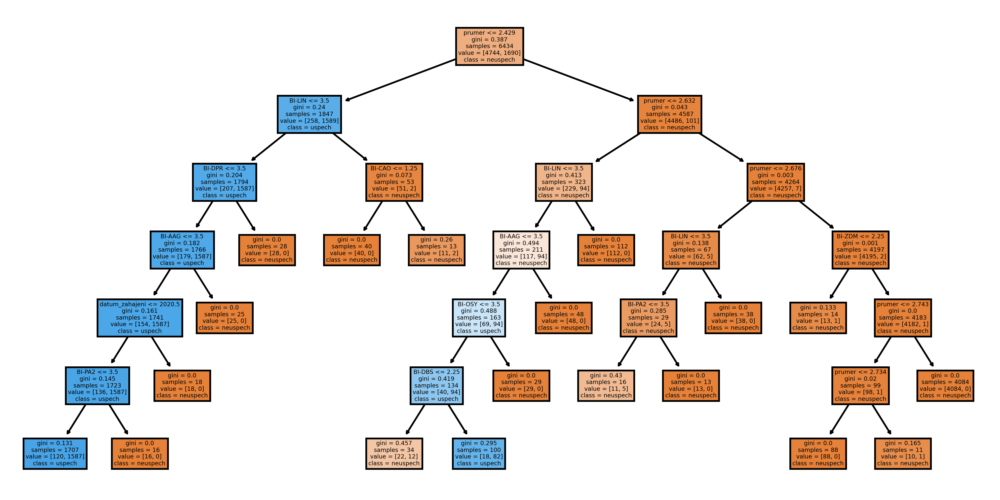

In [27]:
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (10,5), dpi=500)
tree.plot_tree(dt_f1.best_estimator_,
               feature_names = Xdata.columns, 
               class_names=['neuspech', 'uspech'],
               filled = True);
fig.savefig('tree_f1.png')

#### Random forest

In [28]:
param_grid_rf = {
    'criterion':['gini','entropy'],
    'n_estimators': range(5, 50, 5),
    'max_depth': range(2, 4),
    'max_features': ['sqrt', 'log2', None],
    'min_samples_leaf':[10]
}

In [29]:
rf_f1 = get_best_parameters(param_grid_rf, RandomForestClassifier)

Best hyper-parameters are: 
{'criterion': 'entropy', 'max_depth': 3, 'max_features': 'log2', 'min_samples_leaf': 10, 'n_estimators': 40}

0.918501 (+/-0.015520) for {'criterion': 'gini', 'max_depth': 2, 'max_features': 'sqrt', 'min_samples_leaf': 10, 'n_estimators': 5}
0.925027 (+/-0.012678) for {'criterion': 'gini', 'max_depth': 2, 'max_features': 'sqrt', 'min_samples_leaf': 10, 'n_estimators': 10}
0.921557 (+/-0.010669) for {'criterion': 'gini', 'max_depth': 2, 'max_features': 'sqrt', 'min_samples_leaf': 10, 'n_estimators': 15}
0.922958 (+/-0.018844) for {'criterion': 'gini', 'max_depth': 2, 'max_features': 'sqrt', 'min_samples_leaf': 10, 'n_estimators': 20}
0.924698 (+/-0.014791) for {'criterion': 'gini', 'max_depth': 2, 'max_features': 'sqrt', 'min_samples_leaf': 10, 'n_estimators': 25}
0.929009 (+/-0.011587) for {'criterion': 'gini', 'max_depth': 2, 'max_features': 'sqrt', 'min_samples_leaf': 10, 'n_estimators': 30}
0.923699 (+/-0.014271) for {'criterion': 'gini', 'max_depth': 2, 

In [30]:
print('accuracy score (train): {0:.6f}'.format(metrics.accuracy_score(ytrain, rf_f1.predict(Xtrain))))
print('accuracy score (test): {0:.6f}'.format(metrics.accuracy_score(ytest, rf_f1.predict(Xtest))))

accuracy score (train): 0.961144
accuracy score (test): 0.958981


In [31]:
feature_importances=pd.DataFrame({'features':Xtrain.columns,'feature_importance':rf_f1.best_estimator_.feature_importances_})
feature_importances.sort_values('feature_importance',ascending=False)

,features,feature_importance
31,prumer,0.327561
22,BI-AAG,0.142035
23,BI-ZDM,0.107585
20,BI-LIN,0.088762
27,BI-PST,0.084496
24,BI-OSY,0.063424
17,BI-PA2,0.053591
25,BI-PSI,0.034538
26,BI-BEZ,0.027306
16,BI-ZMA,0.021013


#### SVM

In [32]:
param_grid_svm = {
    'kernel':['linear', 'rbf'],
    'gamma':['auto', 'scale'],
    'C':[100, 10, 1, 0.1]
}
param_comb_svm = ParameterGrid(param_grid_svm)

In [33]:
svc_f1 = get_best_parameters(param_grid_svm, SVC)

Best hyper-parameters are: 
{'C': 1, 'gamma': 'auto', 'kernel': 'rbf'}

0.932666 (+/-0.015622) for {'C': 100, 'gamma': 'auto', 'kernel': 'linear'}
0.936126 (+/-0.009095) for {'C': 100, 'gamma': 'auto', 'kernel': 'rbf'}
0.932666 (+/-0.015622) for {'C': 100, 'gamma': 'scale', 'kernel': 'linear'}
0.538195 (+/-0.024835) for {'C': 100, 'gamma': 'scale', 'kernel': 'rbf'}
0.930845 (+/-0.014135) for {'C': 10, 'gamma': 'auto', 'kernel': 'linear'}
0.943772 (+/-0.008145) for {'C': 10, 'gamma': 'auto', 'kernel': 'rbf'}
0.930845 (+/-0.014135) for {'C': 10, 'gamma': 'scale', 'kernel': 'linear'}
0.000000 (+/-0.000000) for {'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}
0.933242 (+/-0.016049) for {'C': 1, 'gamma': 'auto', 'kernel': 'linear'}
0.950053 (+/-0.006113) for {'C': 1, 'gamma': 'auto', 'kernel': 'rbf'}
0.933242 (+/-0.016049) for {'C': 1, 'gamma': 'scale', 'kernel': 'linear'}
0.000000 (+/-0.000000) for {'C': 1, 'gamma': 'scale', 'kernel': 'rbf'}
0.938481 (+/-0.008056) for {'C': 0.1, 'gamma': 'auto

In [34]:
print('accuracy score (train): {0:.6f}'.format(metrics.accuracy_score(ytrain, svc_f1.predict(Xtrain))))
print('accuracy score (test): {0:.6f}'.format(metrics.accuracy_score(ytest, svc_f1.predict(Xtest))))

accuracy score (train): 0.979018
accuracy score (test): 0.968303


#### Adaboost

In [35]:
param_grid_ab = {
    'n_estimators': range(5, 50, 5),
    'learning_rate': np.arange(0.1, 1., 0.1)
}

In [36]:
ab_f1 = get_best_parameters(param_grid_ab, AdaBoostClassifier)

Best hyper-parameters are: 
{'learning_rate': 0.7000000000000001, 'n_estimators': 35}

0.906782 (+/-0.013760) for {'learning_rate': 0.1, 'n_estimators': 5}
0.935083 (+/-0.010596) for {'learning_rate': 0.1, 'n_estimators': 10}
0.938216 (+/-0.011160) for {'learning_rate': 0.1, 'n_estimators': 15}
0.940410 (+/-0.010674) for {'learning_rate': 0.1, 'n_estimators': 20}
0.948516 (+/-0.012982) for {'learning_rate': 0.1, 'n_estimators': 25}
0.951323 (+/-0.014165) for {'learning_rate': 0.1, 'n_estimators': 30}
0.953182 (+/-0.012657) for {'learning_rate': 0.1, 'n_estimators': 35}
0.953453 (+/-0.011886) for {'learning_rate': 0.1, 'n_estimators': 40}
0.954804 (+/-0.011927) for {'learning_rate': 0.1, 'n_estimators': 45}
0.929554 (+/-0.013132) for {'learning_rate': 0.2, 'n_estimators': 5}
0.932318 (+/-0.014001) for {'learning_rate': 0.2, 'n_estimators': 10}
0.938535 (+/-0.009493) for {'learning_rate': 0.2, 'n_estimators': 15}
0.949408 (+/-0.009971) for {'learning_rate': 0.2, 'n_estimators': 20}
0.950

In [37]:
print('accuracy score (train): {0:.6f}'.format(metrics.accuracy_score(ytrain, ab_f1.predict(Xtrain))))
print('accuracy score (test): {0:.6f}'.format(metrics.accuracy_score(ytest, ab_f1.predict(Xtest))))

accuracy score (train): 0.981815
accuracy score (test): 0.977626


In [38]:
feature_importances=pd.DataFrame({'features':Xtrain.columns,'feature_importance':ab_f1.best_estimator_.feature_importances_})
feature_importances.sort_values('feature_importance',ascending=False)

,features,feature_importance
31,prumer,0.171429
2,datum_zahajeni,0.114286
28,BI-DPR,0.114286
3,rok_maturity,0.057143
22,BI-AAG,0.057143
23,BI-ZDM,0.057143
27,BI-PST,0.057143
26,BI-BEZ,0.057143
11,BI-PA1,0.057143
13,BI-CAO,0.028571


#### Xgboost

In [39]:
param_grid = {
    'eta': np.arange(0.1, 1., 0.1),
    'max_depth': range(3, 8)
}
param_comb = ParameterGrid(param_grid)

In [40]:
xgb_f1 = get_best_parameters(param_grid, XGBClassifier, True)

Best hyper-parameters are: 
{'eta': 0.1, 'max_depth': 6}

0.959264 (+/-0.009723) for {'eta': 0.1, 'max_depth': 3}
0.961169 (+/-0.010193) for {'eta': 0.1, 'max_depth': 4}
0.962000 (+/-0.008889) for {'eta': 0.1, 'max_depth': 5}
0.962887 (+/-0.008625) for {'eta': 0.1, 'max_depth': 6}
0.962232 (+/-0.005706) for {'eta': 0.1, 'max_depth': 7}
0.962300 (+/-0.008465) for {'eta': 0.2, 'max_depth': 3}
0.959868 (+/-0.005988) for {'eta': 0.2, 'max_depth': 4}
0.959563 (+/-0.005390) for {'eta': 0.2, 'max_depth': 5}
0.957891 (+/-0.005395) for {'eta': 0.2, 'max_depth': 6}
0.958635 (+/-0.009868) for {'eta': 0.2, 'max_depth': 7}
0.958108 (+/-0.005949) for {'eta': 0.30000000000000004, 'max_depth': 3}
0.955967 (+/-0.005659) for {'eta': 0.30000000000000004, 'max_depth': 4}
0.959267 (+/-0.006203) for {'eta': 0.30000000000000004, 'max_depth': 5}
0.955252 (+/-0.004387) for {'eta': 0.30000000000000004, 'max_depth': 6}
0.958119 (+/-0.009302) for {'eta': 0.30000000000000004, 'max_depth': 7}
0.957426 (+/-0.007061)

In [41]:
print('accuracy score XGBoost (train): {0:.6f}'.format(metrics.accuracy_score(ytrain, xgb_f1.predict(Xtrain))))
print('accuracy score XGBoost (val): {0:.6f}'.format(metrics.accuracy_score(ytest, xgb_f1.predict(Xtest))))

accuracy score XGBoost (train): 0.990208
accuracy score XGBoost (val): 0.978869


In [42]:
feat_imp = pd.Series(xgb_f1.best_estimator_.get_booster().get_fscore()).sort_values(ascending=False)

In [43]:
feat_imp

prumer                    127.0
BI-DPR                    105.0
datum_zahajeni            100.0
BI-LIN                     84.0
BI-PA2                     83.0
BI-AAG                     82.0
BI-PA1                     81.0
BI-OSY                     69.0
maturita_nastup_rozdil     62.0
BI-ZDM                     60.0
BI-DBS                     58.0
BI-BEZ                     55.0
BI-PST                     53.0
BI-AG1                     51.0
rok_maturity               46.0
BI-PS1                     44.0
BI-PSI                     42.0
BI-EMP                     40.0
BI-SAP                     35.0
BI-MLO                     29.0
BI-ZMA                     23.0
BI-PAI                     22.0
praha                      22.0
BI-SI1.2                   19.0
BI-CAO                     17.0
gymnazium                  17.0
je_cech                     3.0
scio                        2.0
pohlavi_kod                 1.0
dtype: float64

#### MLP

In [44]:
mlp = MLPClassifier(random_state=1, max_iter=500).fit(Xtrain, ytrain)

In [45]:
print('accuracy score mlp (train): {0:.6f}'.format(metrics.accuracy_score(ytrain, mlp.predict(Xtrain))))
print('accuracy score mlp (val): {0:.6f}'.format(metrics.accuracy_score(ytest, mlp.predict(Xtest))))

accuracy score mlp (train): 0.858564
accuracy score mlp (val): 0.859540


#### Lineární regrese

In [46]:
reg = LinearRegression().fit(Xtrain, ytrain)

In [47]:
print('RMSE reg (test):', np.sqrt(mean_squared_error(reg.predict(Xtrain), np.array(ytrain))))
print('RMSE reg (test):', np.sqrt(mean_squared_error(reg.predict(Xtest), np.array(ytest))))

RMSE reg (test): 0.20834254149709824
RMSE reg (test): 0.20973394721890065


#### kNN

In [48]:
param_grid = {
    'n_neighbors' : range(1, 12), # Počet nejbližších sousedů
    'p': range(1, 3), # Stupeň Minkowského vzdálenosti
    'weights': ['uniform', 'distance'], # Aritmetický, nebo vážený průměr
}
param_comb = ParameterGrid(param_grid)

In [49]:
knn = get_best_parameters(param_grid, KNeighborsClassifier)

Best hyper-parameters are: 
{'n_neighbors': 3, 'p': 1, 'weights': 'distance'}

0.914767 (+/-0.015551) for {'n_neighbors': 1, 'p': 1, 'weights': 'uniform'}
0.914767 (+/-0.015551) for {'n_neighbors': 1, 'p': 1, 'weights': 'distance'}
0.909871 (+/-0.020230) for {'n_neighbors': 1, 'p': 2, 'weights': 'uniform'}
0.909871 (+/-0.020230) for {'n_neighbors': 1, 'p': 2, 'weights': 'distance'}
0.903793 (+/-0.013539) for {'n_neighbors': 2, 'p': 1, 'weights': 'uniform'}
0.914363 (+/-0.014722) for {'n_neighbors': 2, 'p': 1, 'weights': 'distance'}
0.905871 (+/-0.024080) for {'n_neighbors': 2, 'p': 2, 'weights': 'uniform'}
0.908937 (+/-0.021541) for {'n_neighbors': 2, 'p': 2, 'weights': 'distance'}
0.925943 (+/-0.012015) for {'n_neighbors': 3, 'p': 1, 'weights': 'uniform'}
0.926979 (+/-0.011346) for {'n_neighbors': 3, 'p': 1, 'weights': 'distance'}
0.919459 (+/-0.017346) for {'n_neighbors': 3, 'p': 2, 'weights': 'uniform'}
0.919459 (+/-0.017346) for {'n_neighbors': 3, 'p': 2, 'weights': 'distance'}
0.9

In [50]:
print('accuracy score knn (train): {0:.6f}'.format(metrics.accuracy_score(ytrain, knn.predict(Xtrain))))
print('accuracy score knn (val): {0:.6f}'.format(metrics.accuracy_score(ytest, knn.predict(Xtest))))

accuracy score knn (train): 1.000000
accuracy score knn (val): 0.952144


## Testování po semestrech

### Doplnění 0

#### Pouze nepředmětové příznaky

In [51]:
Xtest_0 = Xtest.copy(deep=True)

courses_not_use = courses
for course in courses_not_use:
    Xtest_0.loc[:, course] = 0
Xtest_0.loc[:, 'prumer'] = 5

#### 1. semestr

In [52]:
Xtest_1 = Xtest.copy(deep=True)

courses_not_use = courses_2 + courses_3 + courses_4 + courses_5 + courses_6 + courses_7
for course in courses_not_use:
    Xtest_1.loc[:, course] = 0

Xtest_1.loc[:, 'prumer'] = 5

#### První dva semestry

In [53]:
Xtest_2 = Xtest.copy(deep=True)

courses_not_use = courses_3 + courses_4 + courses_5 + courses_6 + courses_7

for course in courses_not_use:
    Xtest_2.loc[:, course] = 0
    
Xtest_2.loc[:, 'prumer'] = 5

#### První tři semestry

In [54]:
Xtest_3 = Xtest.copy(deep=True)

courses_not_use = courses_4 + courses_5 + courses_6 + courses_7

for course in courses_not_use:
    Xtest_3.loc[:, course] = 0
    
Xtest_3.loc[:, 'prumer'] = 5

#### První čtyři semestry 

In [55]:
Xtest_4 = Xtest.copy(deep=True)

courses_not_use = courses_5 + courses_6 + courses_7

for course in courses_not_use:
    Xtest_4.loc[:, course] = 0
    
Xtest_4.loc[:, 'prumer'] = 5

#### Prvních pět semestrů

In [56]:
Xtest_5 = Xtest.copy(deep=True)

courses_not_use = courses_6 + courses_7

for course in courses_not_use:
    Xtest_5.loc[:, course] = 0
    
Xtest_5.loc[:, 'prumer'] = 5

#### Všechny semestry bez SI1.2 a EMP

In [57]:
Xtest_6 = Xtest.copy(deep=True)

courses_not_use = courses_7

for course in courses_not_use:
    Xtest_6.loc[:, course] = 0
    
Xtest_6.loc[:, 'prumer'] = 5

### Doplnění průměrem

#### Pouze nepředmětové příznaky

In [58]:
Xtest_0_mean = Xtest.copy(deep=True)

courses_not_use = courses
for course in courses_not_use:
    Xtest_0_mean.loc[:, course] = means[course]
Xtest_0_mean.loc[:, 'prumer'] = prumer_mean

#### První semestr

In [59]:
Xtest_1_mean = Xtest.copy(deep=True)

courses_not_use = courses_2 + courses_3 + courses_4 + courses_5 + courses_6 + courses_7
for course in courses_not_use:
    Xtest_1_mean.loc[:, course] = means[course]

Xtest_1_mean['prumer'] = matrix_bak.loc[:, 'BI-PA1':'BI-ZMA'].mean(axis=1)
Xtest_1_mean['prumer'].fillna(prumer_mean, inplace=True)

#### První dva semestry

In [60]:
Xtest_2_mean = Xtest.copy(deep=True)

courses_not_use = courses_3 + courses_4 + courses_5 + courses_6 + courses_7

for course in courses_not_use:
    Xtest_2_mean.loc[:, course] = means[course]
    
Xtest_2_mean['prumer'] = matrix_bak.loc[:, 'BI-PA1':'BI-LIN'].mean(axis=1)
Xtest_2_mean['prumer'].fillna(prumer_mean, inplace=True)

#### První tři semestry

In [61]:
Xtest_3_mean = Xtest.copy(deep=True)

courses_not_use = courses_4 + courses_5 + courses_6 + courses_7

for course in courses_not_use:
    Xtest_3_mean.loc[:, course] = means[course]
    
Xtest_3_mean['prumer'] = matrix_bak.loc[:, 'BI-PA1':'BI-ZDM'].mean(axis=1)
Xtest_3_mean['prumer'].fillna(prumer_mean, inplace=True)

#### První čtyři semestry 

In [62]:
Xtest_4_mean = Xtest.copy(deep=True)

courses_not_use = courses_5 + courses_6 + courses_7

for course in courses_not_use:
    Xtest_4_mean.loc[:, course] = means[course]
    
Xtest_4_mean['prumer'] = matrix_bak.loc[:, 'BI-PA1':'BI-BEZ'].mean(axis=1)
Xtest_4_mean['prumer'].fillna(prumer_mean, inplace=True)

#### Prvních pět semestrů

In [63]:
Xtest_5_mean = Xtest.copy(deep=True)

courses_not_use = courses_6 + courses_7

for course in courses_not_use:
    Xtest_5_mean.loc[:, course] = means[course]
    
Xtest_5_mean['prumer'] = matrix_bak.loc[:, 'BI-PA1':'BI-PST'].mean(axis=1)
Xtest_5_mean['prumer'].fillna(prumer_mean, inplace=True)

#### Všechny semestry bez SI1.2 a EMP

In [64]:
Xtest_6_mean = Xtest.copy(deep=True)

courses_not_use = courses_7

for course in courses_not_use:
    Xtest_6_mean.loc[:, course] = means[course]
    
Xtest_6_mean['prumer'] = matrix_bak.loc[:, 'BI-PA1':'BI-PST'].mean(axis=1)
Xtest_6_mean['prumer'].fillna(prumer_mean, inplace=True)

## Výsledky

In [65]:
results = pd.DataFrame(columns=['dt', 'rf', 'svm', 'ab', 'xgb', 'mlp', 'knn'], index=[0, 1, 2, 3, 4, 5, 6, 7])
results_mean = pd.DataFrame(columns=['dt', 'rf', 'svm', 'ab', 'xgb', 'mlp', 'knn'], index=[0, 1, 2, 3, 4, 5, 6, 7])

results_f1 = pd.DataFrame(columns=['dt', 'rf', 'svm', 'ab', 'xgb', 'mlp', 'knn'], index=[0, 1, 2, 3, 4, 5, 6, 7])
results_mean_f1 = pd.DataFrame(columns=['dt', 'rf', 'svm', 'ab', 'xgb', 'mlp', 'knn'], index=[0, 1, 2, 3, 4, 5, 6, 7])

In [66]:
results_reg = pd.DataFrame(columns=['reg'], index=[0, 1, 2, 3, 4, 5, 6, 7])
results_reg_mean = pd.DataFrame(columns=['reg'], index=[0, 1, 2, 3, 4, 5, 6, 7])

### Linearní regrese měřena pomocí RMSE

#### Doplněno 0

In [67]:
x_test = {0:Xtest_0, 1:Xtest_1, 2:Xtest_2, 3:Xtest_3, 4:Xtest_4, 5:Xtest_5, 6:Xtest_6, 7:Xtest}
for i in range(0, 8):   
    results_reg.loc[i, 'reg'] = round(np.sqrt(mean_squared_error(reg.predict(x_test[i]), np.array(ytest))), 3)

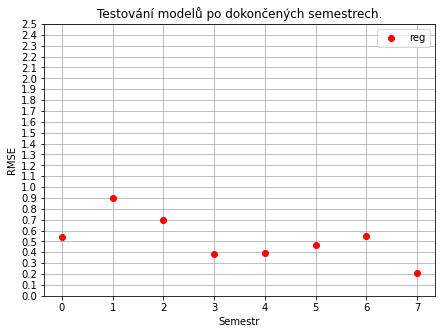

In [68]:
plt.figure(figsize=(7,5))
plt.grid(True)

xreg = results_reg['reg'].index
yreg = results_reg['reg'].values

y_values = np.arange(0.0, 2.55, 0.1)

plt.plot(xreg, yreg, 'o', color='r', label='reg')

plt.title('Testování modelů po dokončených semestrech.')

plt.yticks(y_values)
plt.xlabel('Semestr')
plt.ylabel('RMSE')

plt.legend()

plt.show()

In [69]:
results_reg

,reg
0,0.543
1,0.902
2,0.694
3,0.389
4,0.394
5,0.467
6,0.554
7,0.21


#### Doplněno průměrem

In [70]:
x_test_mean = {0:Xtest_0_mean, 1:Xtest_1_mean, 2:Xtest_2_mean, 3:Xtest_3_mean, 4:Xtest_4_mean, 5:Xtest_5_mean, 6:Xtest_6_mean, 7:Xtest}
for i in range(0, 8):
    results_reg_mean.loc[i, 'reg'] = round(np.sqrt(mean_squared_error(reg.predict(x_test_mean[i]), np.array(ytest))), 3)

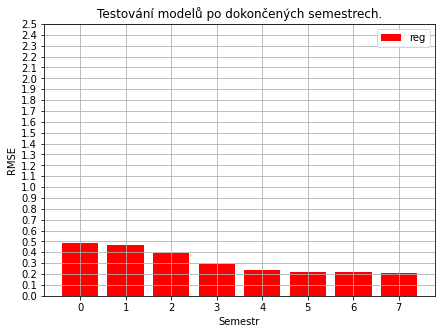

In [71]:
plt.figure(figsize=(7,5))
plt.grid(True)

xreg = results_reg_mean['reg'].index
yreg = results_reg_mean['reg'].values

y_values = np.arange(0.0, 2.55, 0.1)

plt.bar(xreg, yreg, color='r', label='reg')

plt.title('Testování modelů po dokončených semestrech.')

plt.yticks(y_values)
plt.xlabel('Semestr')
plt.ylabel('RMSE')

plt.legend()

plt.show()

In [72]:
results_reg_mean

,reg
0,0.49
1,0.465
2,0.394
3,0.294
4,0.239
5,0.222
6,0.217
7,0.21


## Ostatní modely
### Měřeno accuracy_score

In [73]:
x_test = {0:Xtest_0, 1:Xtest_1, 2:Xtest_2, 3:Xtest_3, 4:Xtest_4, 5:Xtest_5, 6:Xtest_6, 7:Xtest}
for i in range(0, 8):
    results.loc[i, 'dt'] = round(metrics.accuracy_score(ytest, dt_f1.predict(x_test[i])), 3)
    results.loc[i, 'rf'] = round(metrics.accuracy_score(ytest, rf_f1.predict(x_test[i])), 3)
    results.loc[i, 'svm'] = round(metrics.accuracy_score(ytest, svc_f1.predict(x_test[i])), 3)
    results.loc[i, 'ab'] = round(metrics.accuracy_score(ytest, ab_f1.predict(x_test[i])), 3)
    results.loc[i, 'xgb'] = round(metrics.accuracy_score(ytest, xgb_f1.predict(x_test[i])), 3)
    results.loc[i, 'mlp'] = round(metrics.accuracy_score(ytest, mlp.predict(x_test[i])), 3)
    results.loc[i, 'knn'] = round(metrics.accuracy_score(ytest, knn.predict(x_test[i])), 3)

In [74]:
x_test_mean = {0:Xtest_0_mean, 1:Xtest_1_mean, 2:Xtest_2_mean, 3:Xtest_3_mean, 4:Xtest_4_mean, 5:Xtest_5_mean, 6:Xtest_6_mean, 7:Xtest}
for i in range(0, 8):
    results_mean.loc[i, 'dt'] = round(metrics.accuracy_score(ytest, dt_f1.predict(x_test_mean[i])), 3)
    results_mean.loc[i, 'rf'] = round(metrics.accuracy_score(ytest, rf_f1.predict(x_test_mean[i])), 3)
    results_mean.loc[i, 'svm'] = round(metrics.accuracy_score(ytest, svc_f1.predict(x_test_mean[i])), 3)
    results_mean.loc[i, 'ab'] = round(metrics.accuracy_score(ytest, ab_f1.predict(x_test_mean[i])), 3)
    results_mean.loc[i, 'xgb'] = round(metrics.accuracy_score(ytest, xgb_f1.predict(x_test_mean[i])), 3)
    results_mean.loc[i, 'mlp'] = round(metrics.accuracy_score(ytest, mlp.predict(x_test_mean[i])), 3)
    results_mean.loc[i, 'knn'] = round(metrics.accuracy_score(ytest, knn.predict(x_test_mean[i])), 3)

#### Po doplnění 0

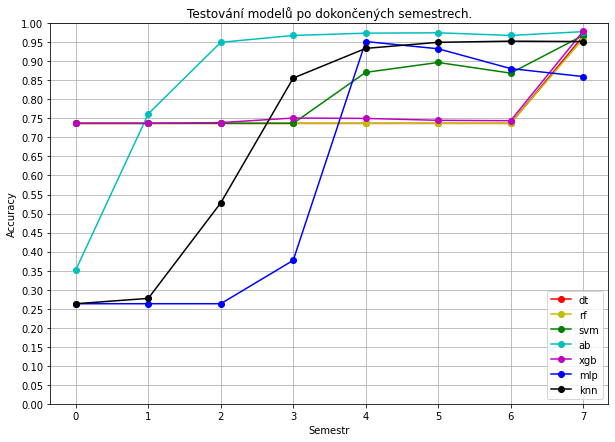

In [75]:
plt.figure(figsize=(10,7))
plt.grid(True)

xdt = results['dt'].index
ydt = results['dt'].values

xrf = results['rf'].index
yrf = results['rf'].values

xsvm = results['svm'].index
ysvm = results['svm'].values

xab = results['ab'].index
yab = results['ab'].values

xxgb = results['xgb'].index
yxgb = results['xgb'].values

xmlp = results['mlp'].index
ymlp = results['mlp'].values

xknn = results['knn'].index
yknn = results['knn'].values

y_values = np.arange(0.0, 1.05, 0.05)

plt.plot(xdt, ydt, '-o', color='r', label='dt')
plt.plot(xrf, yrf, '-o', color='y', label='rf')
plt.plot(xsvm, ysvm, '-o', color='g', label='svm')
plt.plot(xab, yab, '-o', color='c', label='ab')
plt.plot(xxgb, yxgb, '-o', color='m', label='xgb')
plt.plot(xmlp, ymlp, '-o', color='b', label='mlp')
plt.plot(xknn, yknn, '-o', color='k', label='knn')


plt.title('Testování modelů po dokončených semestrech.')

plt.yticks(y_values)
plt.xlabel('Semestr')
plt.ylabel('Accuracy')

plt.legend()

plt.ylim(ymin=0)
plt.ylim(ymax=1)

plt.show()

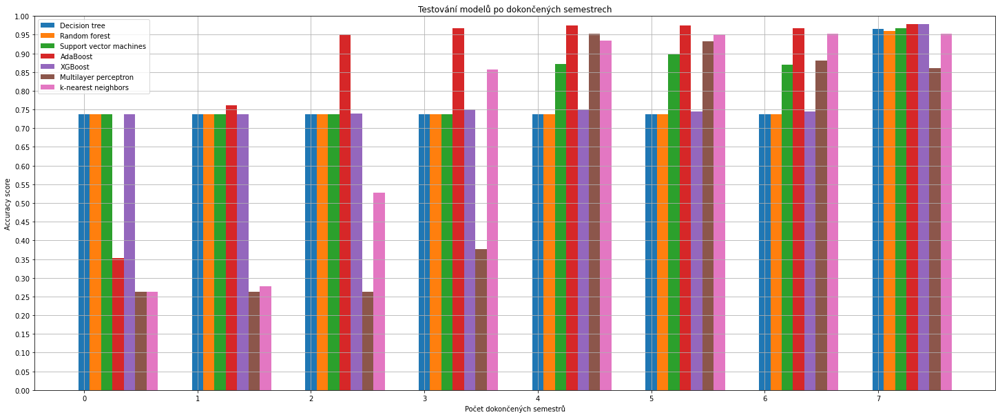

In [77]:
labels = np.array(results.index)

ydt = results['dt'].values

yrf = results['rf'].values

ysvm = results['svm'].values

yab = results['ab'].values

yxgb = results['xgb'].values

ymlp = results['mlp'].values

yknn = results['knn'].values

x = np.arange(len(labels))*2  # the label locations
width = 0.2  # the width of the bars


fig, ax = plt.subplots()
rects_dt = ax.bar(x , ydt, width, label='Decision tree')
rects_rf = ax.bar(x + width, yrf, width, label='Random forest')
rects_svm = ax.bar(x + width * 2, ysvm, width, label='Support vector machines')
rects_ab = ax.bar(x + width * 3, yab, width, label='AdaBoost')
rects_xgb = ax.bar(x + width * 4, yxgb, width, label='XGBoost')
rects_mlp = ax.bar(x + width * 5, ymlp, width, label='Multilayer perceptron')
rects_knn = ax.bar(x + width * 6, yknn, width, label='k-nearest neighbors')

y_values = np.arange(0.0, 1.05, 0.05)

ax.set_ylabel('Accuracy score')
ax.set_xlabel('Počet dokončených semestrů')
ax.set_title('Testování modelů po dokončených semestrech')
ax.set_xticks(x)
ax.set_xticklabels(labels)
plt.yticks(y_values)
ax.legend(loc='best')
ax.grid(True)

plt.ylim(ymin=0)
plt.ylim(ymax=1)

fig.set_size_inches(25,10)
plt.show()

In [78]:
results

,dt,rf,svm,ab,xgb,mlp,knn
0,0.737,0.737,0.737,0.352,0.737,0.263,0.263
1,0.737,0.737,0.737,0.762,0.737,0.263,0.277
2,0.737,0.737,0.737,0.95,0.739,0.263,0.528
3,0.737,0.737,0.737,0.968,0.751,0.377,0.856
4,0.737,0.737,0.871,0.974,0.75,0.952,0.934
5,0.737,0.737,0.897,0.975,0.745,0.933,0.95
6,0.737,0.737,0.869,0.968,0.744,0.881,0.953
7,0.966,0.959,0.968,0.978,0.979,0.86,0.952


#### Po doplněni průměrem

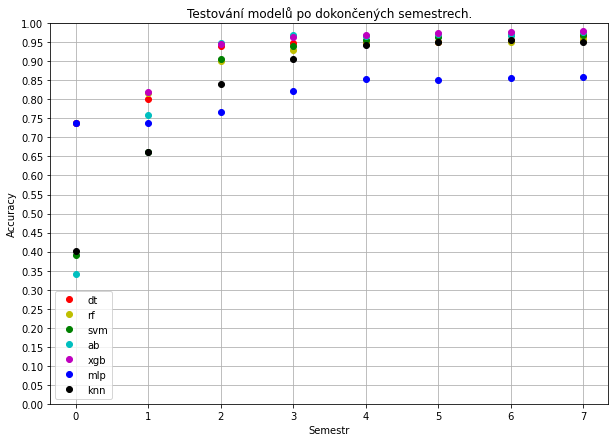

In [79]:
plt.figure(figsize=(10,7))
plt.grid(True)

xdt = results_mean['dt'].index
ydt = results_mean['dt'].values

xrf = results_mean['rf'].index
yrf = results_mean['rf'].values

xsvm = results_mean['svm'].index
ysvm = results_mean['svm'].values

xab = results_mean['ab'].index
yab = results_mean['ab'].values

xxgb = results_mean['xgb'].index
yxgb = results_mean['xgb'].values

xmlp = results_mean['mlp'].index
ymlp = results_mean['mlp'].values

xknn = results_mean['knn'].index
yknn = results_mean['knn'].values

y_values = np.arange(0.0, 1.05, 0.05)

plt.plot(xdt, ydt, '-o', color='r', label='dt')
plt.plot(xrf, yrf, '-o', color='y', label='rf')
plt.plot(xsvm, ysvm, '-o', color='g', label='svm')
plt.plot(xab, yab, '-o', color='c', label='ab')
plt.plot(xxgb, yxgb, '-o', color='m', label='xgb')
plt.plot(xmlp, ymlp, '-o', color='b', label='mlp')
plt.plot(xknn, yknn, '-o', color='k', label='knn')

plt.title('Testování modelů po dokončených semestrech.')

plt.yticks(y_values)
plt.xlabel('Semestr')
plt.ylabel('Accuracy')

plt.legend()

plt.ylim(ymin=0)
plt.ylim(ymax=1)

plt.show()

In [80]:
results_mean

,dt,rf,svm,ab,xgb,mlp,knn
0,0.737,0.737,0.392,0.341,0.737,0.737,0.401
1,0.8,0.818,0.663,0.758,0.82,0.737,0.661
2,0.939,0.901,0.906,0.947,0.946,0.766,0.841
3,0.947,0.931,0.939,0.968,0.965,0.821,0.907
4,0.947,0.945,0.956,0.966,0.97,0.853,0.943
5,0.952,0.952,0.963,0.971,0.975,0.852,0.951
6,0.955,0.95,0.97,0.97,0.977,0.855,0.956
7,0.966,0.959,0.968,0.978,0.979,0.86,0.952


### Měřeno f1_score

In [81]:
x_test = {0:Xtest_0, 1:Xtest_1, 2:Xtest_2, 3:Xtest_3, 4:Xtest_4, 5:Xtest_5, 6:Xtest_6, 7:Xtest}
for i in range(0, 8):
    results_f1.loc[i, 'dt'] = round(metrics.f1_score(ytest, dt_f1.predict(x_test[i])), 3)
    results_f1.loc[i, 'rf'] = round(metrics.f1_score(ytest, rf_f1.predict(x_test[i])), 3)
    results_f1.loc[i, 'svm'] = round(metrics.f1_score(ytest, svc_f1.predict(x_test[i])), 3)
    results_f1.loc[i, 'ab'] = round(metrics.f1_score(ytest, ab_f1.predict(x_test[i])), 3)
    results_f1.loc[i, 'xgb'] = round(metrics.f1_score(ytest, xgb_f1.predict(x_test[i])), 3)
    results_f1.loc[i, 'mlp'] = round(metrics.f1_score(ytest, mlp.predict(x_test[i])), 3)
    results_f1.loc[i, 'knn'] = round(metrics.f1_score(ytest, knn.predict(x_test[i])), 3)

In [82]:
x_test_mean = {0:Xtest_0_mean, 1:Xtest_1_mean, 2:Xtest_2_mean, 3:Xtest_3_mean, 4:Xtest_4_mean, 5:Xtest_5_mean, 6:Xtest_6_mean, 7:Xtest}
for i in range(0, 8):
    results_mean_f1.loc[i, 'dt'] = round(metrics.f1_score(ytest, dt_f1.predict(x_test_mean[i])), 3)
    results_mean_f1.loc[i, 'rf'] = round(metrics.f1_score(ytest, rf_f1.predict(x_test_mean[i])), 3)
    results_mean_f1.loc[i, 'svm'] = round(metrics.f1_score(ytest, svc_f1.predict(x_test_mean[i])), 3)
    results_mean_f1.loc[i, 'ab'] = round(metrics.f1_score(ytest, ab_f1.predict(x_test_mean[i])), 3)
    results_mean_f1.loc[i, 'xgb'] = round(metrics.f1_score(ytest, xgb_f1.predict(x_test_mean[i])), 3)
    results_mean_f1.loc[i, 'mlp'] = round(metrics.f1_score(ytest, mlp.predict(x_test[i])), 3)
    results_mean_f1.loc[i, 'knn'] = round(metrics.f1_score(ytest, knn.predict(x_test[i])), 3)

#### Po doplnění 0

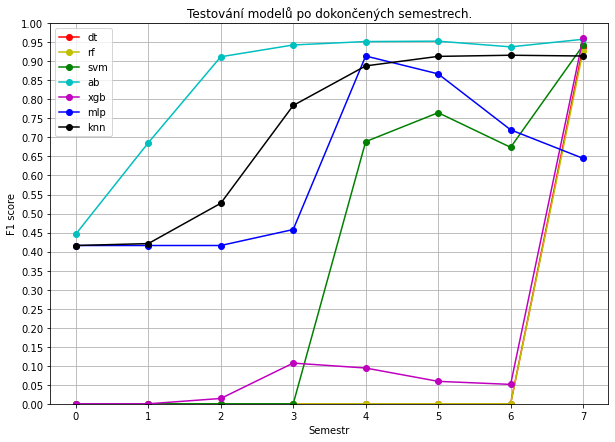

In [87]:
plt.figure(figsize=(10,7))
plt.grid(True)

xdt = results_f1['dt'].index
ydt = results_f1['dt'].values

xrf = results_f1['rf'].index
yrf = results_f1['rf'].values

xsvm = results_f1['svm'].index
ysvm = results_f1['svm'].values

xab = results_f1['ab'].index
yab = results_f1['ab'].values

xxgb = results_f1['xgb'].index
yxgb = results_f1['xgb'].values

xmlp = results_f1['mlp'].index
ymlp = results_f1['mlp'].values

xknn = results_f1['knn'].index
yknn = results_f1['knn'].values

y_values = np.arange(0.0, 1.05, 0.05)

plt.plot(xdt, ydt, '-o', color='r', label='dt')
plt.plot(xrf, yrf, '-o', color='y', label='rf')
plt.plot(xsvm, ysvm, '-o', color='g', label='svm')
plt.plot(xab, yab, '-o', color='c', label='ab')
plt.plot(xxgb, yxgb, '-o', color='m', label='xgb')
plt.plot(xmlp, ymlp, '-o', color='b', label='mlp')
plt.plot(xknn, yknn, '-o', color='k', label='knn')


plt.title('Testování modelů po dokončených semestrech.')

plt.yticks(y_values)
plt.xlabel('Semestr')
plt.ylabel('F1 score')

plt.legend()

plt.ylim(ymin=0)
plt.ylim(ymax=1)

plt.show()

In [84]:
results_f1

,dt,rf,svm,ab,xgb,mlp,knn
0,0,0,0,0.446,0,0.416,0.416
1,0,0,0,0.686,0,0.416,0.421
2,0,0,0,0.912,0.014,0.416,0.527
3,0,0,0,0.943,0.107,0.458,0.784
4,0,0,0.689,0.952,0.094,0.914,0.888
5,0,0,0.765,0.953,0.059,0.867,0.913
6,0,0,0.674,0.938,0.051,0.72,0.916
7,0.938,0.927,0.942,0.958,0.961,0.645,0.914


#### Po doplněni průměrem

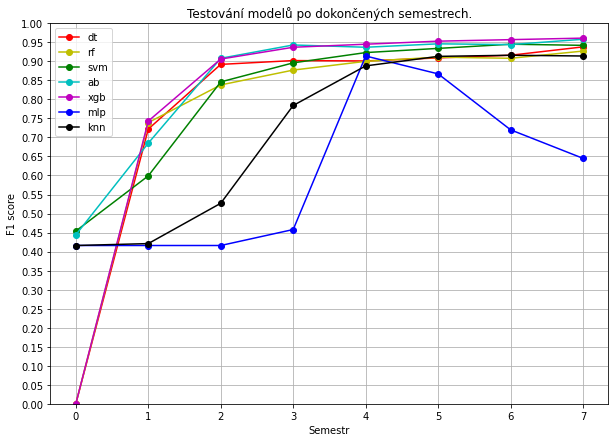

In [88]:
plt.figure(figsize=(10,7))
plt.grid(True)

xdt = results_mean_f1['dt'].index
ydt = results_mean_f1['dt'].values

xrf = results_mean_f1['rf'].index
yrf = results_mean_f1['rf'].values

xsvm = results_mean_f1['svm'].index
ysvm = results_mean_f1['svm'].values

xab = results_mean_f1['ab'].index
yab = results_mean_f1['ab'].values

xxgb = results_mean_f1['xgb'].index
yxgb = results_mean_f1['xgb'].values

xmlp = results_mean_f1['mlp'].index
ymlp = results_mean_f1['mlp'].values

xknn = results_mean_f1['knn'].index
yknn = results_mean_f1['knn'].values

y_values = np.arange(0.0, 1.05, 0.05)

plt.plot(xdt, ydt, '-o', color='r', label='dt')
plt.plot(xrf, yrf, '-o', color='y', label='rf')
plt.plot(xsvm, ysvm, '-o', color='g', label='svm')
plt.plot(xab, yab, '-o', color='c', label='ab')
plt.plot(xxgb, yxgb, '-o', color='m', label='xgb')
plt.plot(xmlp, ymlp, '-o', color='b', label='mlp')
plt.plot(xknn, yknn, '-o', color='k', label='knn')


plt.title('Testování modelů po dokončených semestrech.')

plt.yticks(y_values)
plt.xlabel('Semestr')
plt.ylabel('F1 score')

plt.legend()

plt.ylim(ymin=0)
plt.ylim(ymax=1)

plt.show()

In [86]:
results_mean_f1

,dt,rf,svm,ab,xgb,mlp,knn
0,0,0,0.454,0.444,0,0.416,0.416
1,0.722,0.739,0.599,0.685,0.743,0.416,0.421
2,0.892,0.838,0.846,0.908,0.906,0.416,0.527
3,0.902,0.877,0.896,0.943,0.937,0.458,0.784
4,0.901,0.9,0.923,0.937,0.945,0.914,0.888
5,0.909,0.911,0.934,0.946,0.953,0.867,0.913
6,0.916,0.908,0.945,0.944,0.957,0.72,0.916
7,0.938,0.927,0.942,0.958,0.961,0.645,0.914
